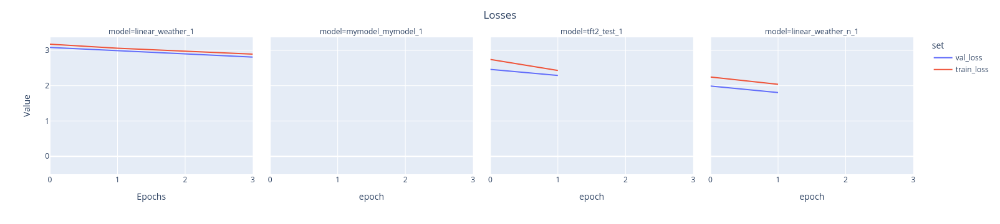

In [3]:
import plotly.express as px
import pandas as pd
import numpy as np
##Check the losses trend
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/test/csv/prova_test_LOSSES.csv')
fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model',width = 2600)
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses

In [3]:
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/test/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)


In [4]:
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/pollen/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)


In [5]:
tot_pred.head()

,Unnamed: 0,region,lag,time,totals,totals_pred,model
13311,13311,Cape_Town,1,2001-04-15,8.719308e-08,0.324316,linear_l_1
13312,13312,Cape_Town,1,2001-04-16,8.719308e-08,0.329245,linear_l_1
61985,61985,Cape_Town,2,2001-04-16,8.719308e-08,0.286236,linear_l_1
13313,13313,Cape_Town,1,2001-04-17,8.719308e-08,0.431536,linear_l_1
61986,61986,Cape_Town,2,2001-04-17,8.719308e-08,0.290985,linear_l_1


In [6]:
tot_pred.groupby(['region','lag']).count()

Unnamed: 0  time  totals  totals_pred  model
region lag                                              
Amiens 1          2803  2803    2803         2803   2803
       2          2803  2803    2803         2803   2803
       3          2803  2803    2803         2803   2803
       4          2803  2803    2803         2803   2803
       5          2803  2803    2803         2803   2803
...                ...   ...     ...          ...    ...
Turku  10         3259  3259    3259         3259   3259
       11         3259  3259    3259         3259   3259
       12         3259  3259    3259         3259   3259
       13         3259  3259    3259         3259   3259
       14         3259  3259    3259         3259   3259

[322 rows x 5 columns]

In [7]:
##some models does not give you the quantiles so, for seek of comparison, you can do this workaroud
tot_pred.y_pred[np.isnan(tot_pred.y_pred)] = tot_pred.y_median[np.isnan(tot_pred.y_pred)] 

AttributeError: 'DataFrame' object has no attribute 'y_median'

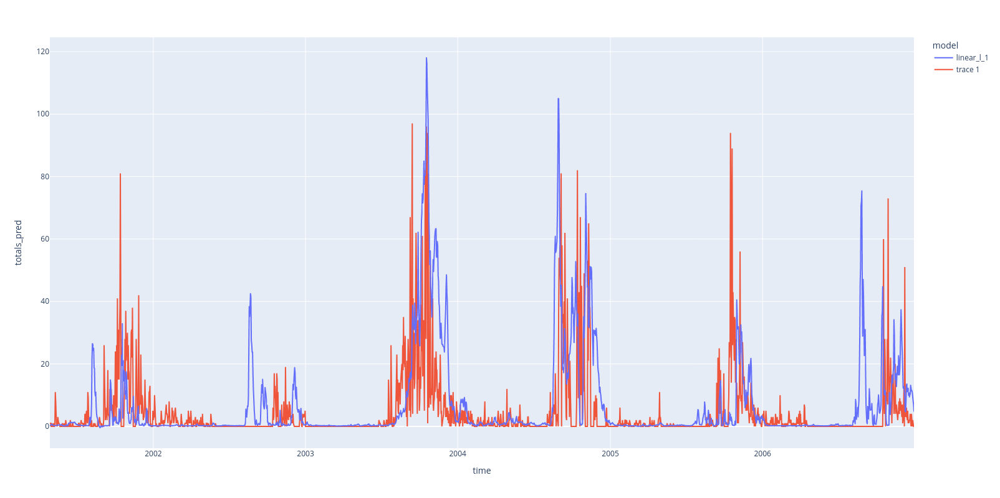

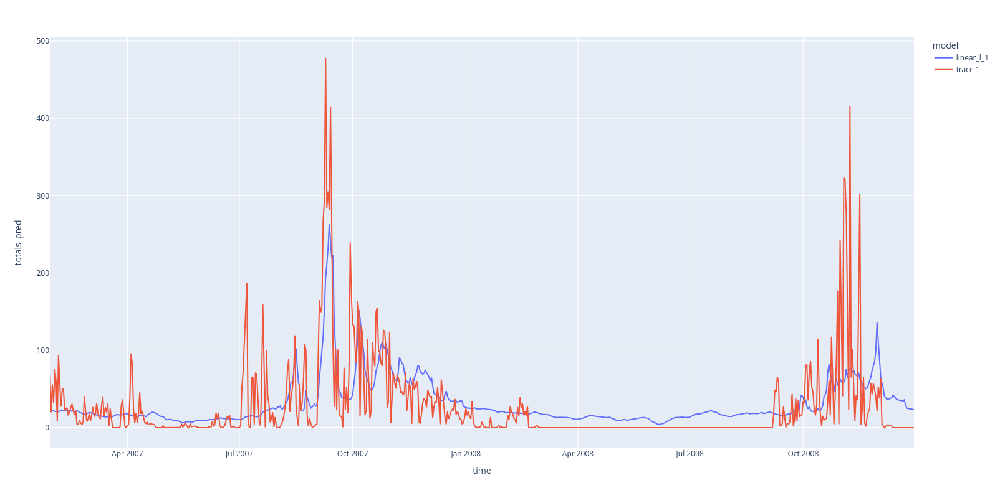

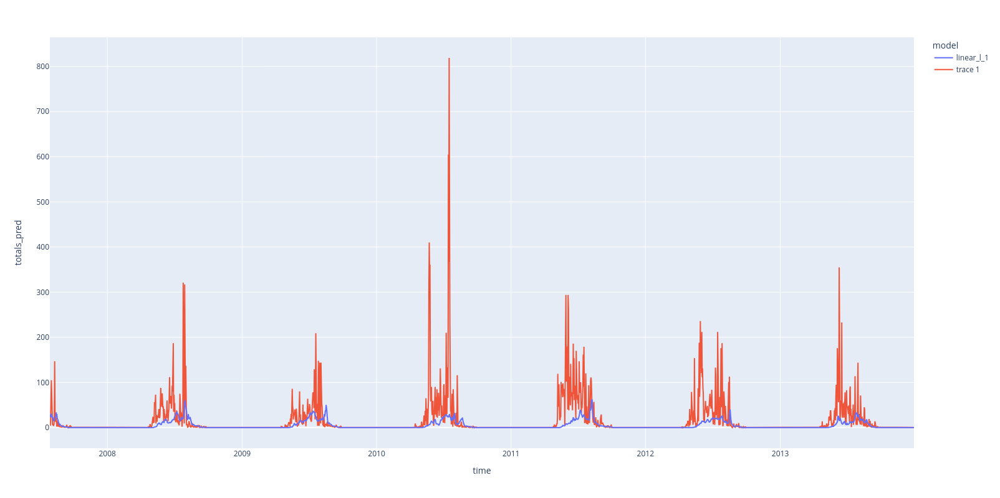

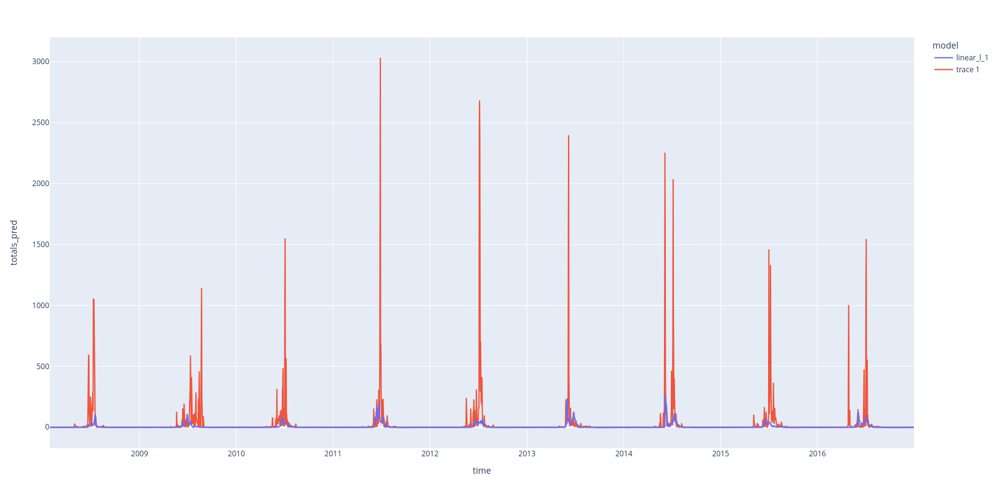

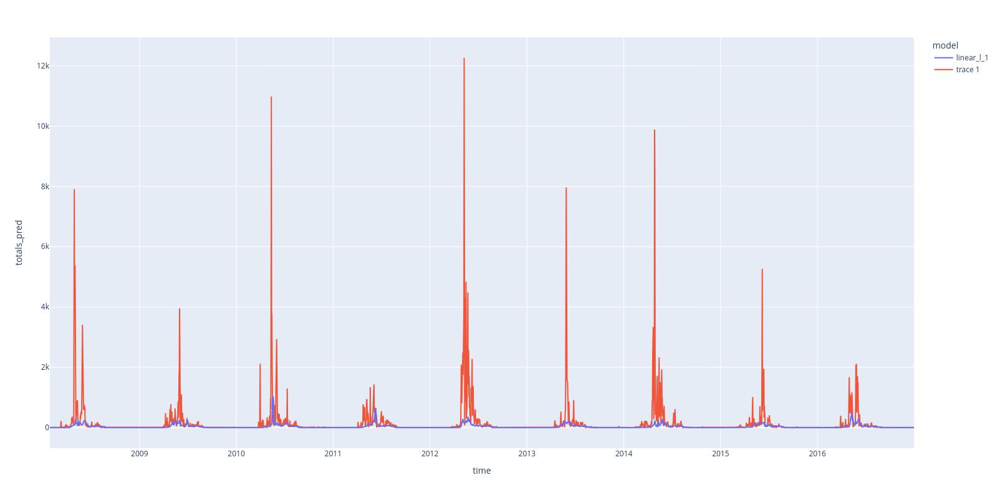

...

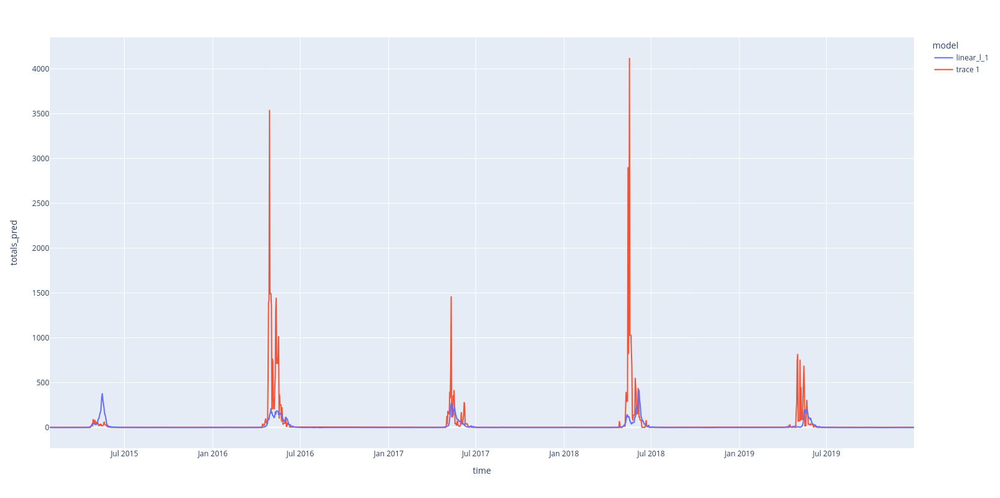

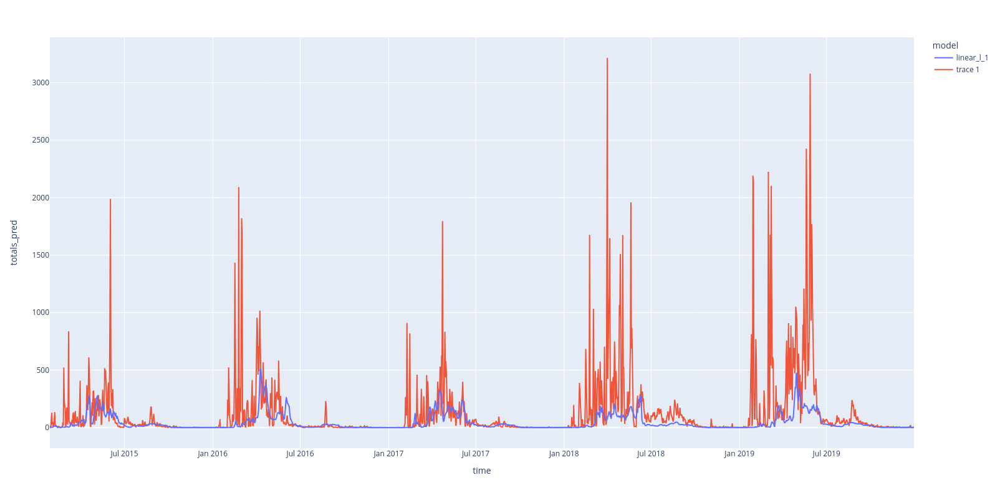

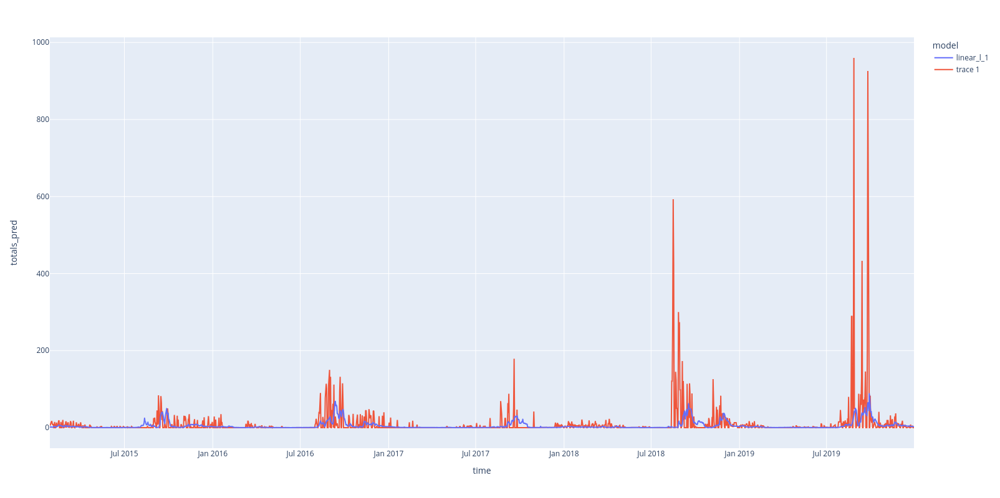

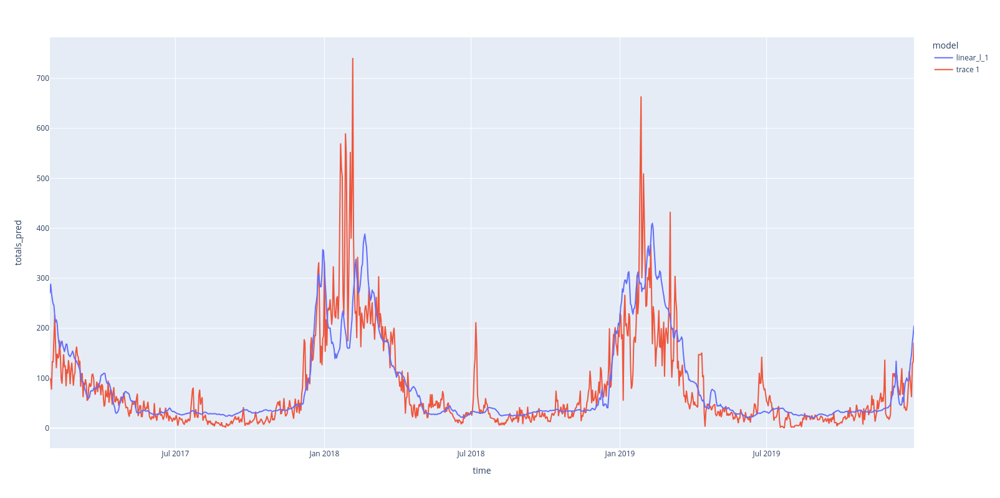

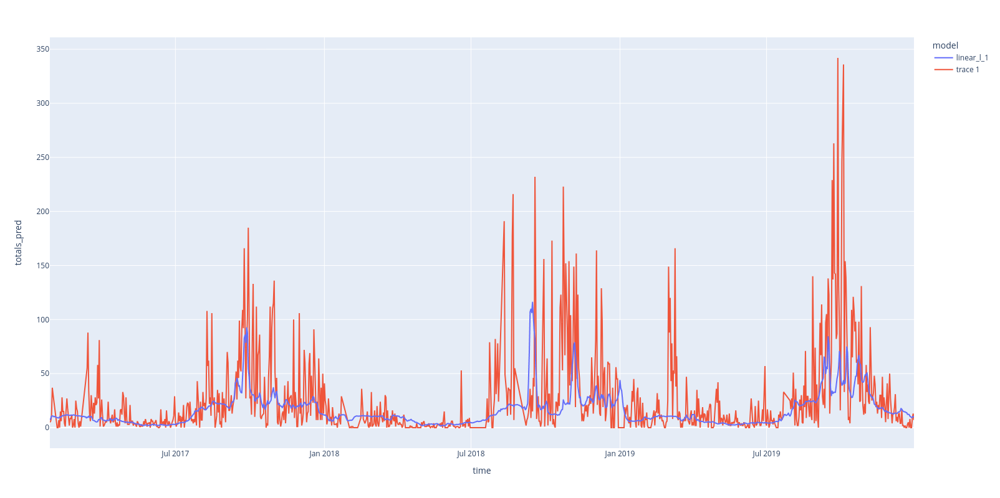

In [8]:
##let see how the prediction at step 10 are
lag=14
for c in tot_pred.region.unique():
    mask = (tot_pred.lag==lag) & (tot_pred.region==c)
    fig = px.line(tot_pred[mask], x='time', y='totals_pred', color='model',height=800)
    fig.add_scatter(x = tot_pred[mask].time, y=tot_pred[mask].totals)
    fig.show()

In [8]:
##let see how the prediction at step 10 are
lag=10

fig = px.line(tot_pred[(tot_pred.lag==lag)], x='time', y='y_median', color='model',height=800)
fig.add_scatter(x = tot_pred[tot_pred.lag==lag].time, y=tot_pred[tot_pred.lag==lag].y)


ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['Unnamed: 0', 'lag', 'time', 'region', 'totals', 'totals_pred', 'model'] but received: y_median

In [16]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: np.nanmean((x.y-x.y_pred)**2)).reset_index().rename(columns={0:'error'}) 


In [7]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_median)/x.y)).reset_index().rename(columns={0:'error'}) 


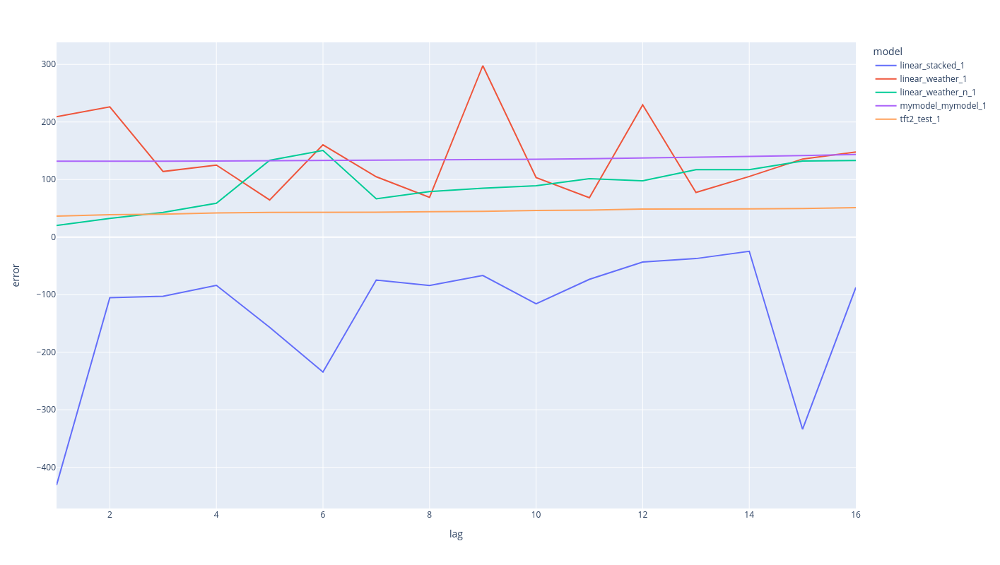

In [8]:
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show()